In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import glob as gb
import cv2
import os
import tensorflow as tf
from tensorflow.keras import layers 
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
import keras


In [3]:
trainpath = '/kaggle/input/seat-belt2/Seat_Belt2/Train'
testpath  = '/kaggle/input/seat-belt2/Seat_Belt2/Test'
predpath  = '/kaggle/input/seat-belt-val/val'

In [4]:
for folder in  os.listdir( trainpath) : 
    files = gb.glob(pathname= str( trainpath +'//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 3700 in folder Seat_Belt
For training data , found 3317 in folder WithoutSeat_Belt


In [5]:

for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str( testpath +'//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 800 in folder Seat_Belt
For testing data , found 669 in folder WithoutSeat_Belt


In [7]:
files = gb.glob(pathname= str(predpath +'/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 384


In [8]:
code = {'Seat_Belt':0 ,'WithoutSeat_Belt':1}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x 

In [11]:
size = []
for folder in  os.listdir(trainpath) : 
    files = gb.glob(pathname= str( trainpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(480, 640, 3)      3988
(1080, 1920, 3)     941
(408, 612, 3)       837
(464, 848, 3)       670
(1101, 1500, 3)      57
                   ... 
(945, 1500, 3)        1
(380, 612, 3)         1
(420, 612, 3)         1
(1086, 1500, 3)       1
(1185, 1500, 3)       1
Length: 106, dtype: int64

In [13]:
size = []
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str( testpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(480, 640, 3)      800
(1080, 1920, 3)    266
(464, 848, 3)      189
(408, 612, 3)      112
(416, 416, 3)       53
(405, 612, 3)       11
(315, 474, 3)        6
(240, 360, 3)        5
(407, 612, 3)        5
(612, 410, 3)        4
(459, 612, 3)        4
(285, 390, 3)        4
(612, 438, 3)        3
(410, 612, 3)        3
(380, 612, 3)        2
(342, 474, 3)        1
(348, 474, 3)        1
dtype: int64

In [14]:
size = []
files = gb.glob(pathname= str(predpath + '/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(480, 640, 3)      240
(1080, 1920, 3)    139
(408, 612, 3)        5
dtype: int64

In [16]:
s = 200

In [17]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath) : 
    files = gb.glob(pathname= str( trainpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [19]:
print(f'we have {len(X_train)} items in X_train')

we have 7017 items in X_train


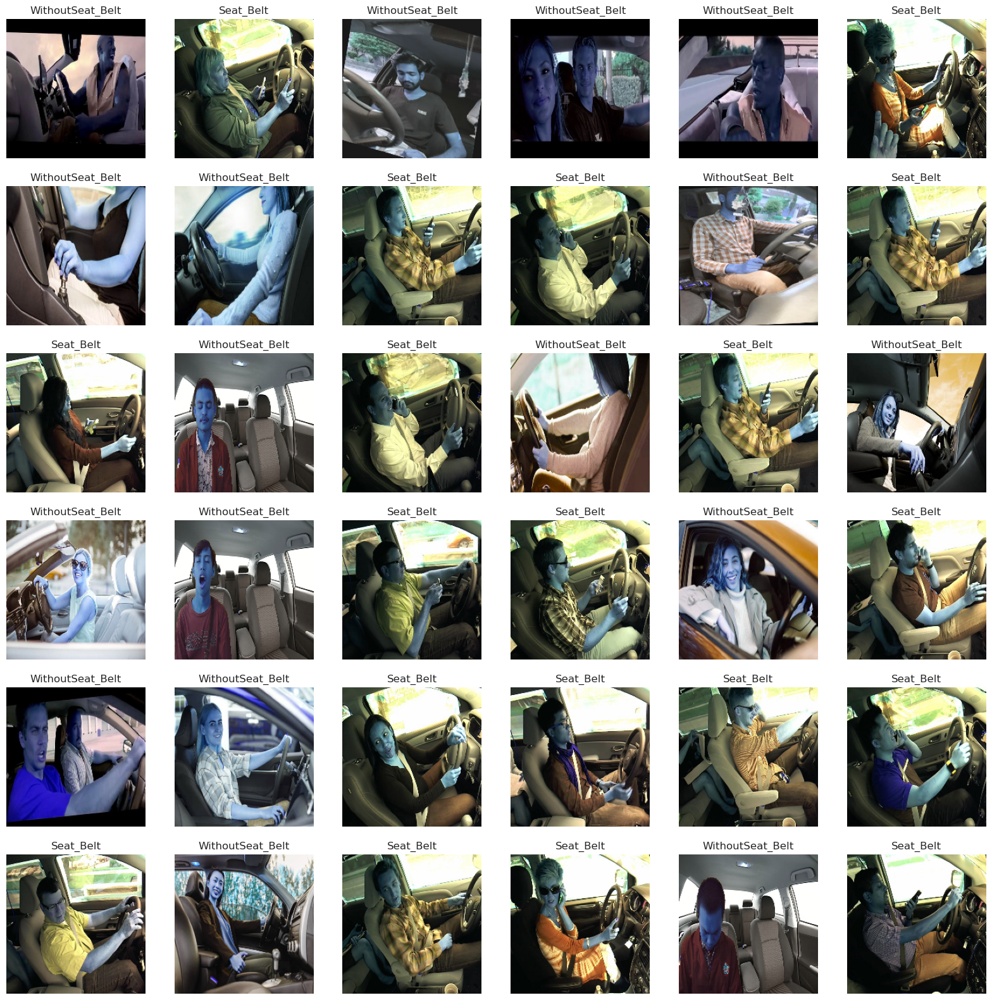

In [20]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [22]:
X_test = []
y_test = []
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str(testpath + '//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [23]:
print(f'we have {len(X_test)} items in X_test')

we have 1469 items in X_test


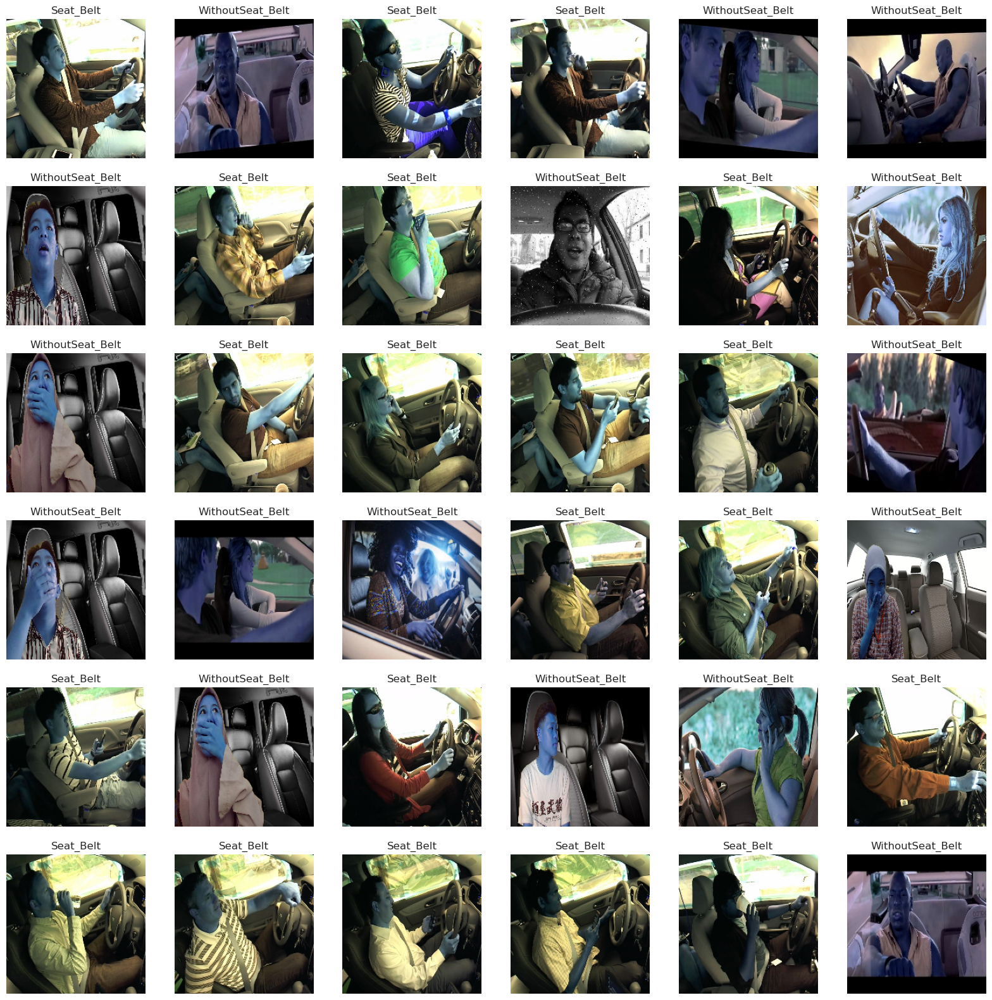

In [24]:

plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [25]:
X_pred = []
files = gb.glob(pathname= str(predpath + '/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))      

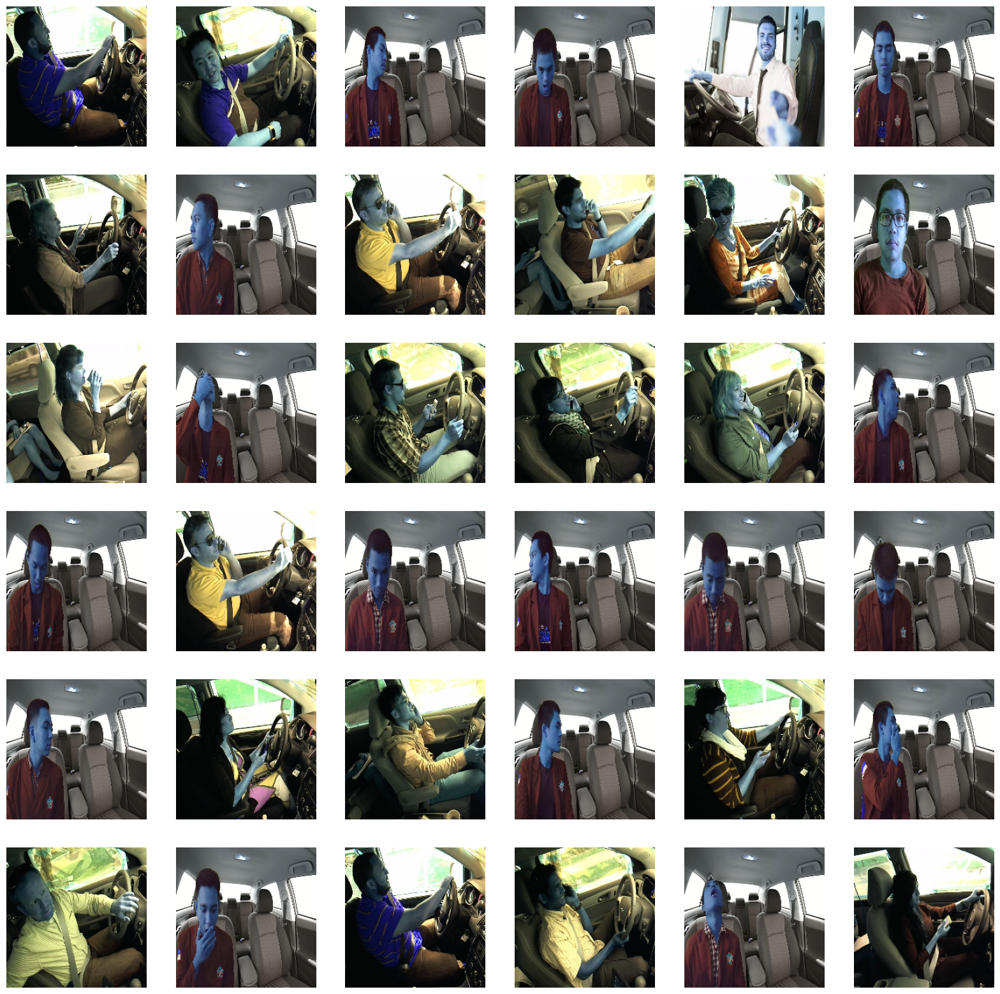

In [26]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

In [27]:
print(f'we have {len(X_pred)} items in X_pred')

we have 384 items in X_pred


In [28]:
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (7017, 200, 200, 3)
X_test shape  is (1469, 200, 200, 3)
y_train shape  is (7017,)
y_test shape  is (1469,)


In [45]:
Model = tf.keras.models.Sequential([

  layers.Conv2D(filters=128,kernel_size=3,activation='relu',input_shape=(s,s,3)),
  layers.MaxPooling2D(pool_size=2),

  layers.Conv2D(filters=64,kernel_size=3,activation='relu',padding='same'),
  layers.MaxPooling2D(pool_size=2),
  layers.BatchNormalization(),
  layers.Dropout(0.5),

  layers.Conv2D(filters=32,kernel_size=3,activation='relu'),
  layers.MaxPooling2D(pool_size=2),
  layers.BatchNormalization(),
  layers.Dropout(0.2),

  layers.Conv2D(filters=16,kernel_size=3,activation='relu'),
  layers.MaxPooling2D(pool_size=2),
  layers.BatchNormalization(),
  layers.Dropout(0.25),

  layers.Flatten(),

  layers.Dense(units=128,activation='relu'),
  layers.BatchNormalization(),
  layers.Dropout(0.25),

  layers.Dense(units=2,activation='softmax')
])

Model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

Model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 198, 198, 128)     3584      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 99, 99, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 99, 99, 64)        73792     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 49, 49, 64)       0         
 g2D)                                                            
                                                                 
 batch_normalization_8 (Batc  (None, 49, 49, 64)       256       
 hNormalization)                                                 
                                                      

In [46]:
ThisModel = model.fit(X_train, y_train, epochs=5 ,batch_size=64,verbose=1 , #validation_data=(X_test,y_test) )

Epoch 1/5
110/110 [==============================] - 1420s 13s/step - loss: 0.0310 - accuracy: 0.9902
Epoch 2/5
110/110 [==============================] - 1481s 13s/step - loss: 0.0144 - accuracy: 0.9947
Epoch 3/5
110/110 [==============================] - 1498s 14s/step - loss: 0.0121 - accuracy: 0.9967
Epoch 4/5
110/110 [==============================] - 1463s 13s/step - loss: 0.0023 - accuracy: 0.9987
Epoch 5/5
110/110 [==============================] - 1472s 13s/step - loss: 0.0043 - accuracy: 0.9986


In [47]:

ModelLoss, ModelAccuracy = model.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

46/46 [==============================] - 82s 2s/step - loss: 0.0400 - accuracy: 0.9925
Test Loss is 0.039978280663490295
Test Accuracy is 0.9925119280815125


In [49]:
labels_new = ["Seat_Belt" , "WithoutSeat_Belt"]

In [56]:
predictions = (model.predict(X_test) > 0.5).astype("int32")

46/46 [==============================] - 113s 2s/step


In [62]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

46/46 [==============================] - 243s 5s/step
Prediction Shape is (1469, 2)


In [64]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (7017, 200, 200, 3)
X_test shape  is (1469, 200, 200, 3)
X_pred shape  is (384, 200, 200, 3)
y_train shape  is (7017,)
y_test shape  is (1469,)


In [65]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

12/12 [==============================] - 65s 5s/step
Prediction Shape is (384, 2)


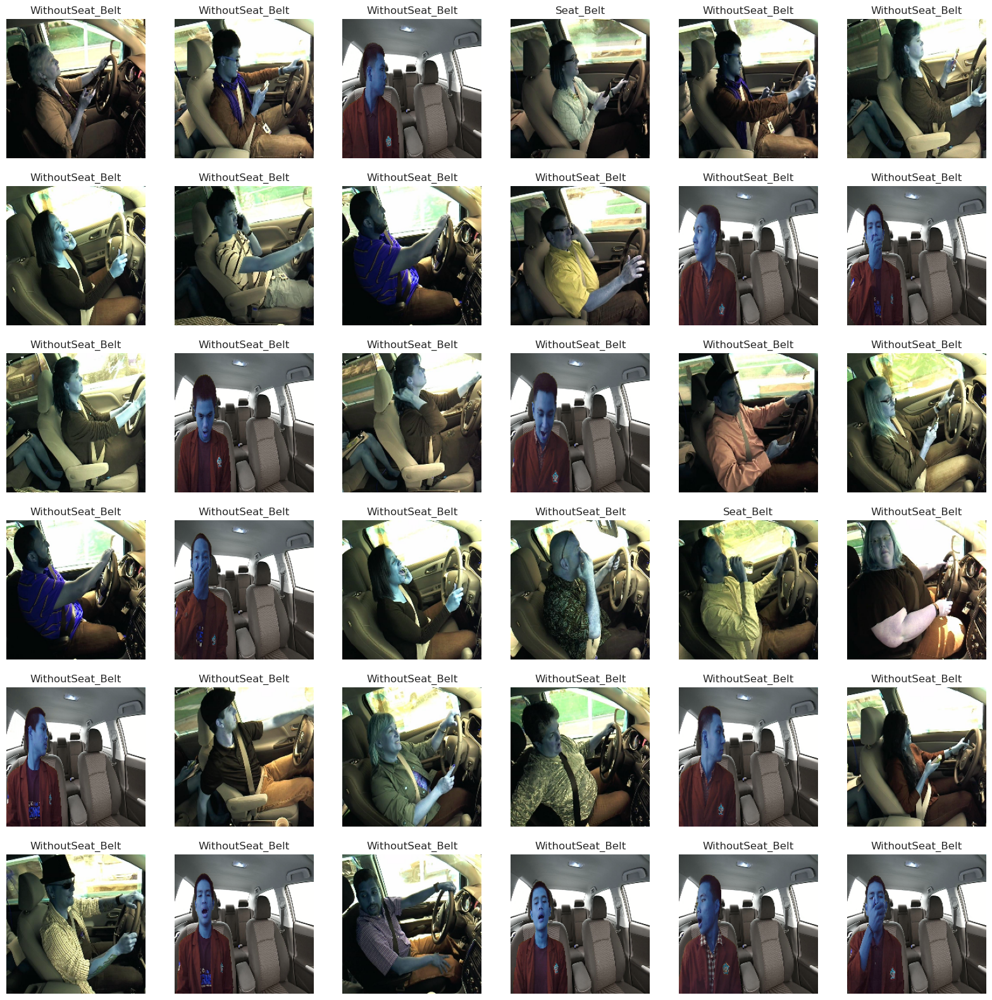

In [70]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [72]:
model.save("Seat_belt.h5")